<h1>Table of Contents<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><span><a href="#Creating-a-new-column-with-cleaned-descriptions" data-toc-modified-id="Creating-a-new-column-with-cleaned-descriptions-1"><span class="toc-item-num">1&nbsp;&nbsp;</span>Creating a new column with cleaned descriptions</a></span></li><li><span><a href="#Creating-a-word-cloud-for-each-job-category" data-toc-modified-id="Creating-a-word-cloud-for-each-job-category-2"><span class="toc-item-num">2&nbsp;&nbsp;</span>Creating a word cloud for each job category</a></span><ul class="toc-item"><li><span><a href="#Word-Clouds" data-toc-modified-id="Word-Clouds-2.1"><span class="toc-item-num">2.1&nbsp;&nbsp;</span>Word Clouds</a></span></li></ul></li><li><span><a href="#Exploring-Term-frequency-and-Inverse-document-frequency" data-toc-modified-id="Exploring-Term-frequency-and-Inverse-document-frequency-3"><span class="toc-item-num">3&nbsp;&nbsp;</span>Exploring Term frequency and Inverse document frequency</a></span><ul class="toc-item"><li><span><a href="#Seeing-the-highest-TFIDF-scores-for-each-category" data-toc-modified-id="Seeing-the-highest-TFIDF-scores-for-each-category-3.1"><span class="toc-item-num">3.1&nbsp;&nbsp;</span>Seeing the highest TFIDF scores for each category</a></span></li></ul></li></ul></div>

# Text analytics

In [1]:
#Importing relevant libraries for this section
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import re
import scipy as sp
from sklearn.model_selection import cross_val_score, train_test_split, cross_val_predict
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from sklearn.naive_bayes import MultinomialNB
from sklearn.linear_model import LogisticRegression, LinearRegression, LassoCV, Lasso
from sklearn import metrics
from textblob import TextBlob, Word
from nltk.stem.snowball import SnowballStemmer
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.externals.six import StringIO  
from IPython.display import Image  
from sklearn.tree import export_graphviz
from nltk.stem import LancasterStemmer, WordNetLemmatizer,PorterStemmer
from nltk.tokenize import sent_tokenize, word_tokenize
from nltk.corpus import stopwords
from wordcloud import WordCloud, STOPWORDS
import pydotplus
%matplotlib inline
import warnings
warnings.filterwarnings("ignore")
from bs4 import BeautifulSoup
import operator
import pprint as pp

In [2]:
#Load the dataframe
jobs=pd.read_csv('cleaned_jobs.csv',index_col=0)

In [3]:
#Quick check to make sure the dataframe looks correct
jobs.head()

,description,title,revised_salary,rel_title,ranking,category,salary_level,state,city
17,Digital Sales Business Analyst\r\r\nOpportunit...,Digital Business Analyst,105000.0,Business Analyst,Normal,Business AnalystNormal,med,NSW,Sydney
21,About the role : As a Business Analyst you wou...,Business Analyst,102500.0,Business Analyst,Normal,Business AnalystNormal,med,NSW,Sydney
32,TNT Express is one of the world's leading prov...,Business Analyst,105000.0,Business Analyst,Normal,Business AnalystNormal,med,NSW,Mascot
34,For over 15 years Quantium have combined the b...,Agile Business Analyst,105000.0,Business Analyst,Normal,Business AnalystNormal,med,NSW,Sydney
36,A vacancy exists in the above unit for a highl...,Business Analyst,105000.0,Business Analyst,Normal,Business AnalystNormal,med,NSW,Darlinghurst


In [4]:
#Resetting the index to make it cleaner and easier to work with
jobs.reset_index(drop=True,inplace=True)

In [5]:
jobs.head()

,description,title,revised_salary,rel_title,ranking,category,salary_level,state,city
0,Digital Sales Business Analyst\r\r\nOpportunit...,Digital Business Analyst,105000.0,Business Analyst,Normal,Business AnalystNormal,med,NSW,Sydney
1,About the role : As a Business Analyst you wou...,Business Analyst,102500.0,Business Analyst,Normal,Business AnalystNormal,med,NSW,Sydney
2,TNT Express is one of the world's leading prov...,Business Analyst,105000.0,Business Analyst,Normal,Business AnalystNormal,med,NSW,Mascot
3,For over 15 years Quantium have combined the b...,Agile Business Analyst,105000.0,Business Analyst,Normal,Business AnalystNormal,med,NSW,Sydney
4,A vacancy exists in the above unit for a highl...,Business Analyst,105000.0,Business Analyst,Normal,Business AnalystNormal,med,NSW,Darlinghurst


In [6]:
#Some of my descriptions still have html tags embedded within, I will need to remove them before continuing
jobs.description[936]

'<h2><strong>About HelloFresh</strong></h2> <p>At HelloFresh, we want to change the way people eat. Over the past 6 years we\'ve seen this mission spread beyond our wildest dreams. Now, we are the leading global company in the expanding online recipe kit delivery market.</p> <p>So, how did we do it? Our weekly recipe boxes full of exciting recipes and lovingly sourced, fresh ingredients have blossomed into a community of inspired, energised home cooks that expands across the globe. We are one of the fastest growing meal kit businesses and are active and growing in 10 different countries across 3 continents.</p> <p>If you would like to join an energetic and highly motivated team and work in a dynamic, high-energy, high-growth field where you can really have an impact and make a difference every single day then join us and become part of developing a global fresh food champion.</p> <h2>Job description</h2> <p style="font-weight: 400;"><strong>You will…</strong></p> <ul style="font-weight

## Creating a new column with cleaned descriptions
I created a new column with the descriptions I obtained for each job but making sure there are no lingering html tags. This was done using BeautifulSoup.

In [7]:
jobs['cleaned_descriptions']=jobs.description.apply(lambda x:BeautifulSoup(x,
                                                        'html.parser', from_encoding="utf-8").text)

In [8]:
jobs.cleaned_descriptions[935]

"About Us\r\r\n\r\r\nWestern Health manages three acute public hospitals: Footscray, Sunshine and Williamstown Hospital. It also operates the Sunbury Day Hospital, Transition Care at Hazeldean and a range of community based services along with a large Drug and Alcohol Service. We care for a culturally diverse population of more than 800,000 people. We have more than 6,700 employees who are driven by our values of ‘Compassion, Accountability, Respect, Excellence and Safety’ (CARES).\r\r\n\r\r\nOur continued growth will see the completion of a new purpose built, multi-storey Joan Kirner Women's and Children's Hospital.\r\r\n\r\r\nAbout the Role\r\r\n\r\r\nAn exciting opportunity for a Business Analyst is available within the Financial Planning & Analysis team at Western Health. This position is based at the Sunshine and Footscray Hospital.\r\r\n\r\r\nReporting to the Manager of Financial Planning & Analysis, you will provide business planning, performance reporting and financial analysis

## Creating a word cloud for each job category
I wanted to visually inspect each of the categories to see what was being taken as the most imortant words for each description. To do this I decided to make a word cloud.`

In [9]:
jobs.head()

,description,title,revised_salary,rel_title,ranking,category,salary_level,state,city,cleaned_descriptions
0,Digital Sales Business Analyst\r\r\nOpportunit...,Digital Business Analyst,105000.0,Business Analyst,Normal,Business AnalystNormal,med,NSW,Sydney,Digital Sales Business Analyst\r\r\nOpportunit...
1,About the role : As a Business Analyst you wou...,Business Analyst,102500.0,Business Analyst,Normal,Business AnalystNormal,med,NSW,Sydney,About the role : As a Business Analyst you wou...
2,TNT Express is one of the world's leading prov...,Business Analyst,105000.0,Business Analyst,Normal,Business AnalystNormal,med,NSW,Mascot,TNT Express is one of the world's leading prov...
3,For over 15 years Quantium have combined the b...,Agile Business Analyst,105000.0,Business Analyst,Normal,Business AnalystNormal,med,NSW,Sydney,For over 15 years Quantium have combined the b...
4,A vacancy exists in the above unit for a highl...,Business Analyst,105000.0,Business Analyst,Normal,Business AnalystNormal,med,NSW,Darlinghurst,A vacancy exists in the above unit for a highl...


In [10]:
# Using all the descriptions that belong in each category,
#I added them all up to make one description that encapsulates all of them
total_description = jobs.groupby('category')['cleaned_descriptions'].apply(', '.join).reset_index()
total_description=pd.DataFrame(total_description)

In [11]:
total_description

,category,cleaned_descriptions
0,Business AnalystJunior,Resonate is an Australian tech start up that h...
1,Business AnalystNormal,Digital Sales Business Analyst\r\r\nOpportunit...
2,Business AnalystSenior,VP Senior Business Analyst\r\r\nSingapore\r\r\...
3,Data AnalystJunior,"Datasource Services has extensive, internation..."
4,Data AnalystNormal,Microsoft Business Intelligence Developer | An...
5,Data AnalystSenior,Are you interested in working for a progressiv...
6,Data ScientistJunior,The Company\r\r\n\r\r\nThis rapidly growing Au...
7,Data ScientistNormal,Data Scientist\r\r\n\r\r\nCPT Global provides ...
8,Data ScientistSenior,This is an awesome opportunity for a Data Scie...


### Word Clouds
I used the stopwrods list from NLTK to start with and intend to add to the list as required after some more EDA.

In [12]:
sw=stopwords.words('english')

Business AnalystJunior


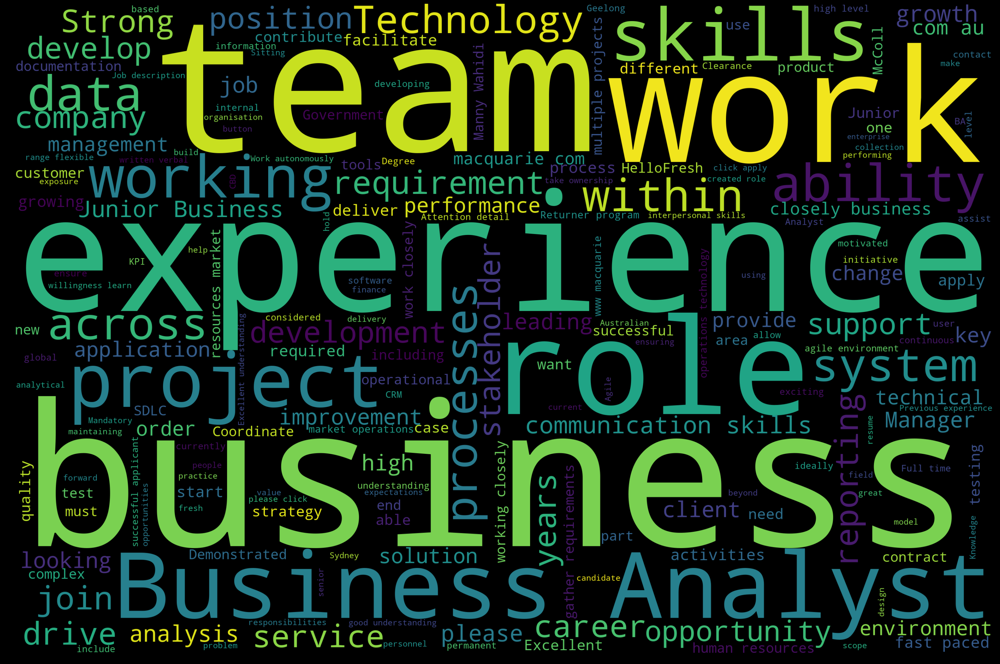

Business AnalystNormal


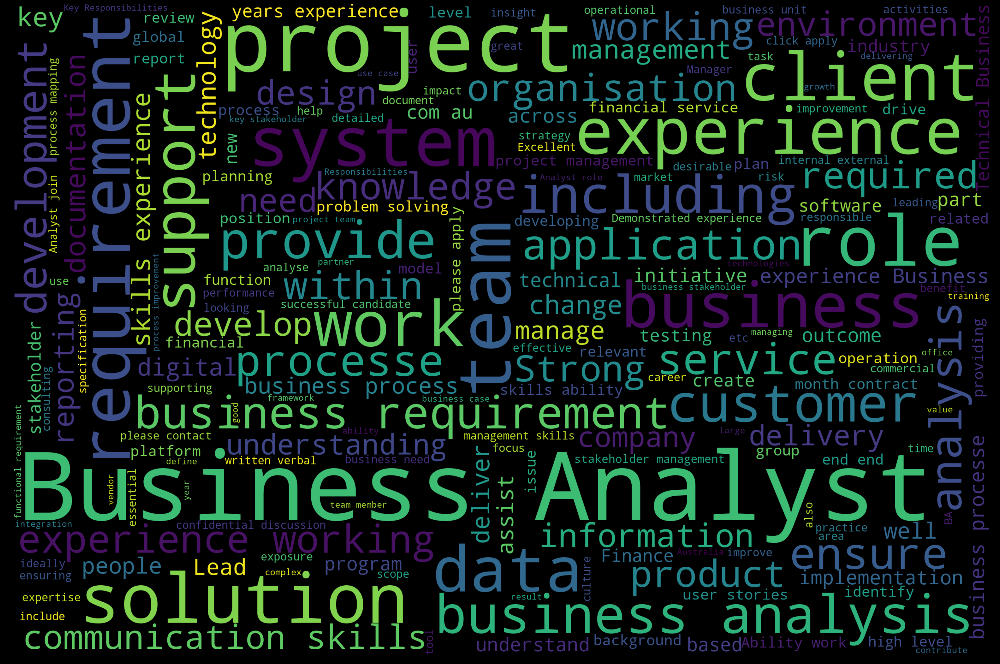

Business AnalystSenior


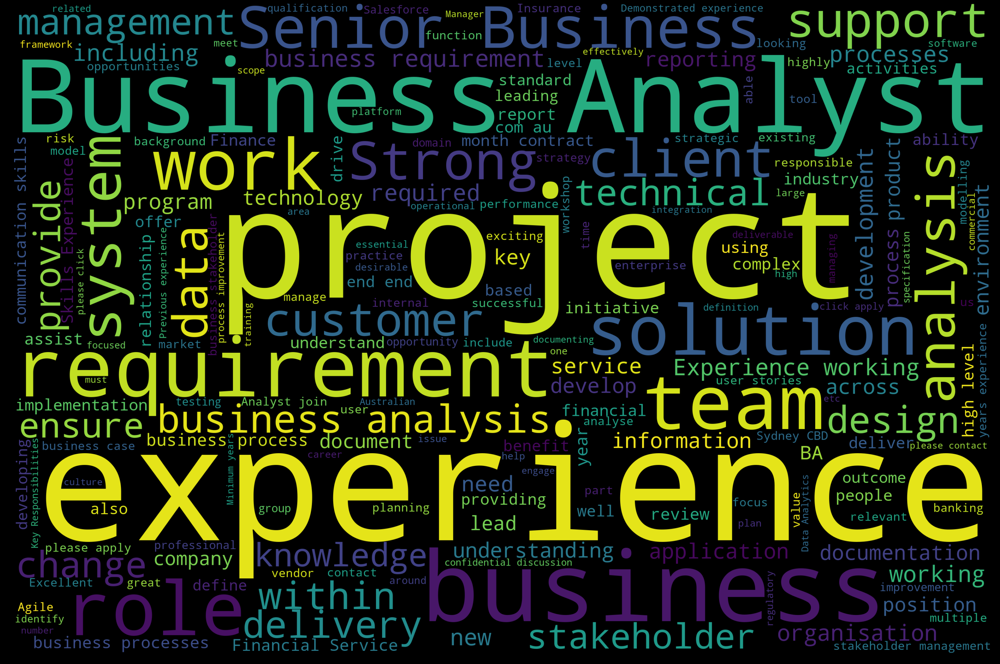

Data AnalystJunior


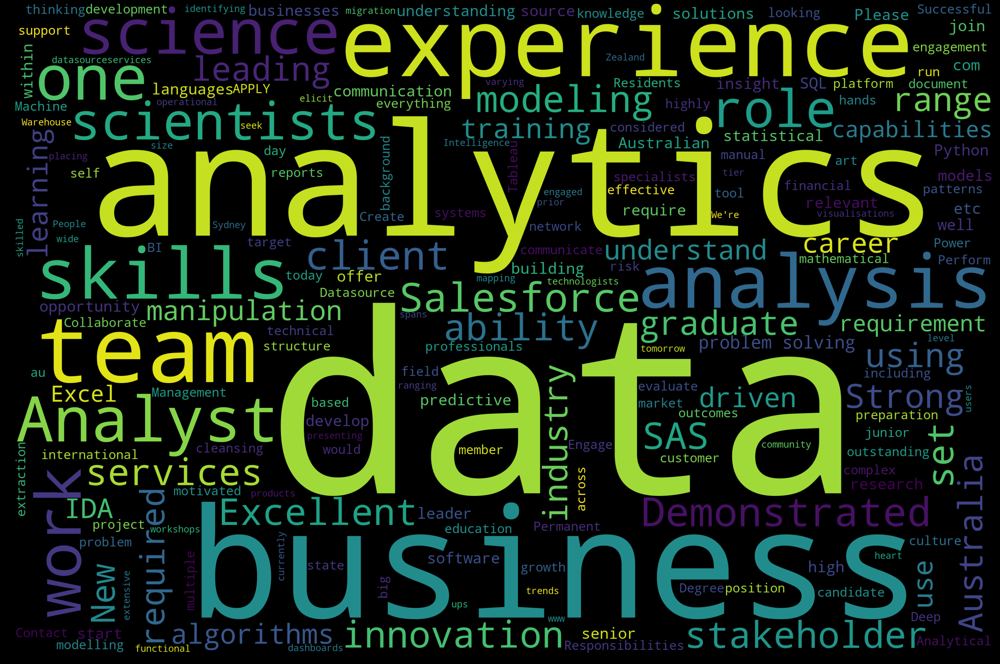

Data AnalystNormal


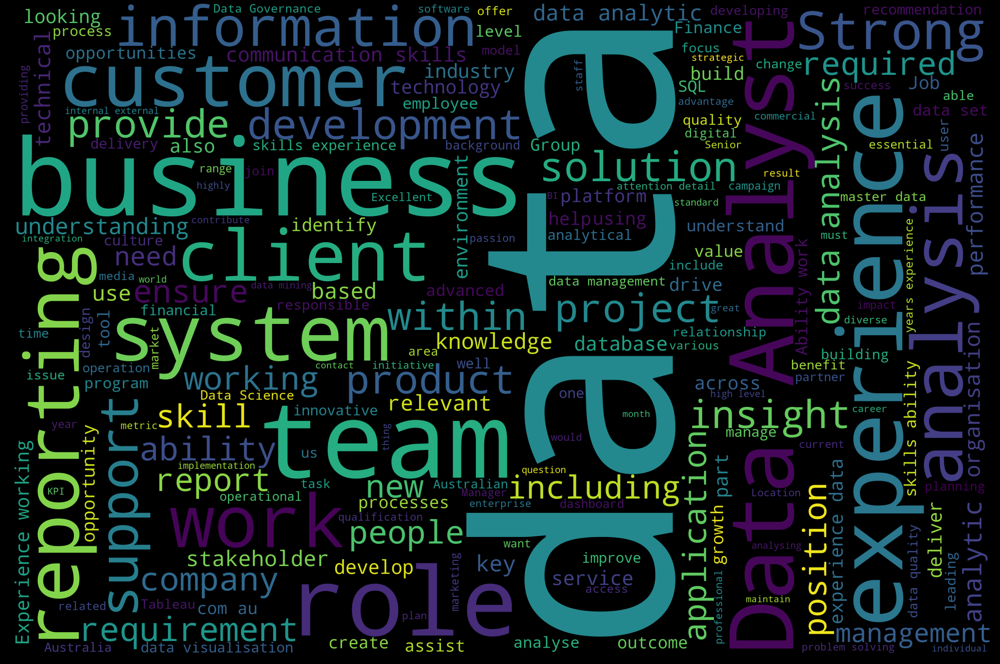

Data AnalystSenior


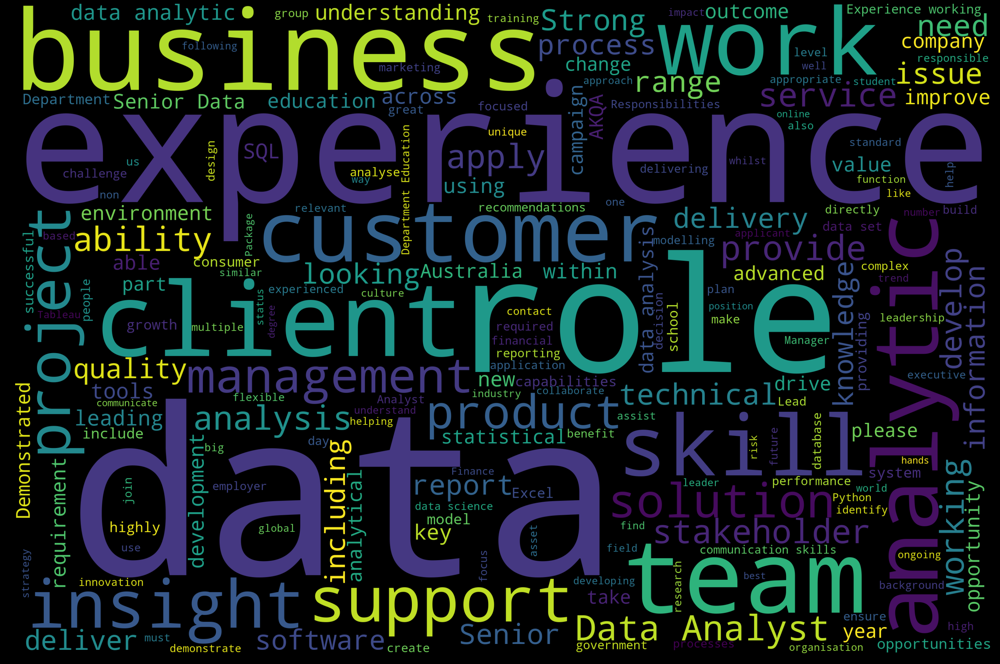

Data ScientistJunior


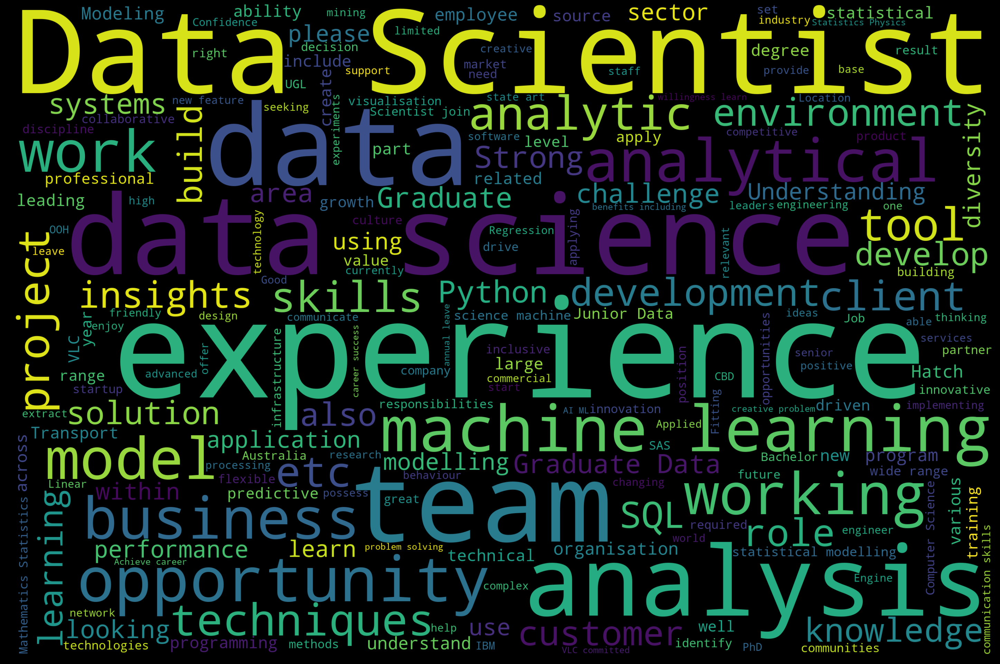

Data ScientistNormal


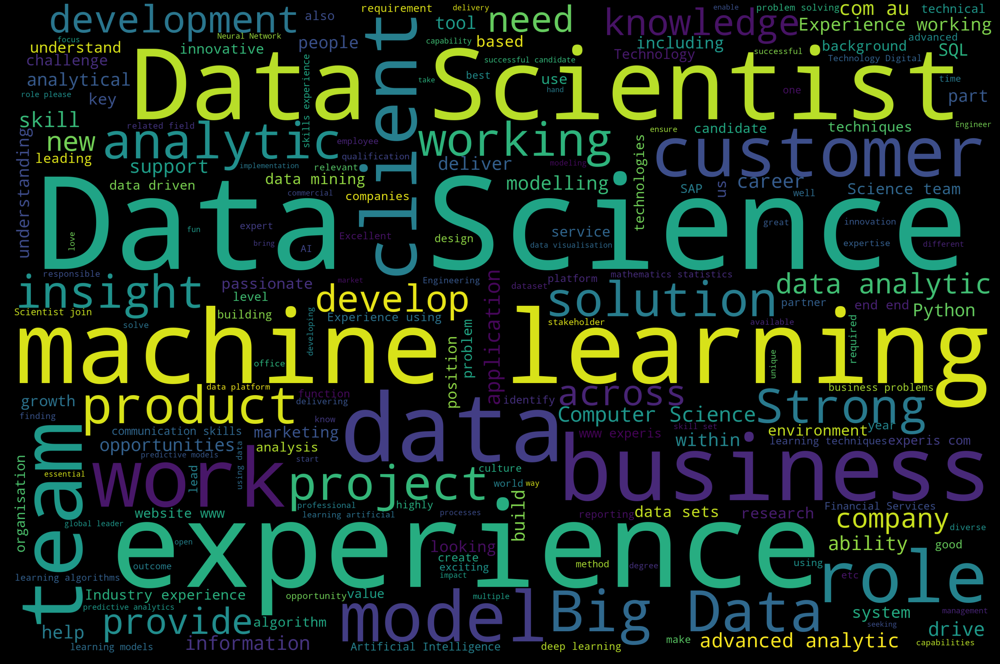

Data ScientistSenior


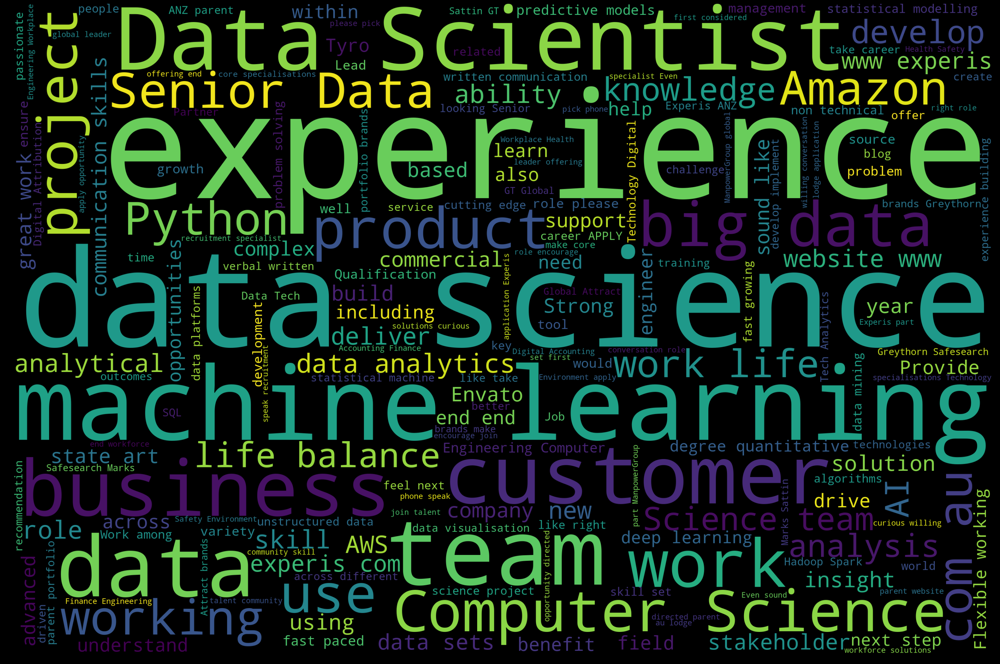

In [14]:
for i in total_description.index:
    print(total_description.iloc[i,0])
    wordcloud = WordCloud(
    width = 3000,
    height = 2000,
    background_color = 'black',
    stopwords = sw).generate(str(total_description.iloc[i,1]))
    name=total_description.iloc[i,0]
    fig = plt.figure(figsize = (40, 30),facecolor = 'k',edgecolor = 'k')
    plt.imshow(wordcloud, interpolation = 'bilinear')
    plt.axis('off')
    plt.tight_layout(pad=0)
    plt.savefig('{}.png'.format(name))
    plt.show()

## Exploring Term frequency and Inverse document frequency 
I decided to explore the TFIDF for the 9 categories of jobs that I created to see how it changes bewteen categories.

In [15]:
#I created 9 new arrays that just encompass the descriptions for those categories to use
business_AnalystJunior=jobs.cleaned_descriptions[jobs.category=='Business AnalystJunior']
business_AnalystSenior=jobs.cleaned_descriptions[jobs.category=='Business AnalystSenior']
business_AnalystNormal=jobs.cleaned_descriptions[jobs.category=='Business AnalystNormal']
data_AnalystJunior=jobs.cleaned_descriptions[jobs.category=='Data AnalystJunior']
data_AnalystNormal=jobs.cleaned_descriptions[jobs.category=='Data AnalystNormal']
data_AnalystSenior=jobs.cleaned_descriptions[jobs.category=='Data AnalystSenior']
data_ScientistJunior=jobs.cleaned_descriptions[jobs.category=='Data ScientistJunior']
data_ScientistNormal=jobs.cleaned_descriptions[jobs.category=='Data ScientistNormal']
data_ScientistSenior=jobs.cleaned_descriptions[jobs.category=='Data ScientistSenior']

In [16]:
list_of_articles=[business_AnalystNormal,data_AnalystNormal,business_AnalystSenior,data_ScientistNormal,data_ScientistSenior,
                  data_AnalystSenior,business_AnalystJunior,data_ScientistJunior,data_AnalystJunior]

In [17]:
names=pd.DataFrame(jobs.category.value_counts())

### Seeing the highest TFIDF scores for each category

In [18]:
def top_ten_TFIDF(list_of_articles):
    for e,i in enumerate(list_of_articles):
        vect = TfidfVectorizer(ngram_range=(2,2),stop_words=sw,max_features=100)
        response = vect.fit_transform(i)
        dictionary = dict(zip(vect.get_feature_names(), response.data))
        sorted_dictionary = sorted(dictionary.items(), key=operator.itemgetter(1),reverse=True)
        print(names.index[e])
        pp.pprint(sorted_dictionary[:5])
        print('***********************************')

In [19]:
top_ten_TFIDF(list_of_articles)

Business AnalystNormal
[('written verbal', 0.655821419284315),
 ('financial services', 0.6452778651617034),
 ('proven experience', 0.5338583946624652),
 ('document business', 0.5270224423188193),
 ('skills strong', 0.5191660674949576)]
***********************************
Data AnalystNormal
[('ad hoc', 0.6649054689682952),
 ('successful role', 0.6461390326237536),
 ('data mining', 0.5838696312393155),
 ('data analyst', 0.5563680167098506),
 ('strong communication', 0.5513257524524439)]
***********************************
Business AnalystSenior
[('analyst join', 0.7781291410743997),
 ('business cases', 0.6222725133178015),
 ('business analysts', 0.5794951048447441),
 ('business case', 0.526272118423659),
 ('process analysis', 0.4755954560520608)]
***********************************
Data ScientistNormal
[('click register', 0.6672520993548915),
 ('artificial intelligence', 0.5901671171619932),
 ('learning artificial', 0.5585835276369181),
 ('data visualisation', 0.5145897138778747),
 ('pre

# Findings from EDA
The key words found in the TFIDF output tells us a lot about what the key words for each category are. Some of the interesting things I found were:

Junior data analysts - they look for sql and python skills

Normal data analysts - strong communication skills

Senior data analysts - tableau is an important skill

Data scientists - Artificial intelligence has a lot of weightage (even though it doesn't exist yet)

Senior data scientists - working with Big data seems to be important

Buissness analyst roles - all seem to focus on efective communication